<a href="https://colab.research.google.com/github/daryaleontyeva/LABS-Images/blob/master/lab6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#!pip install tensorflow==1.2.0 --ignore-installed
#!pip install opencv-python==3.4.2.17
#!pip install opencv-contrib-python==3.4.2.17

import cv2
import os
import matplotlib.pyplot as plt
from keras.preprocessing import image
import numpy as np


Using TensorFlow backend.
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:458: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:459: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:460: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:461: FutureWarn

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
ls 'drive/My Drive/Colab Notebooks'

 Flora/                             Local_global_features.ipynb
 Kleo/                              mahotas.ipynb
 Lab_3_matrix_filters.ipynb         Untitled0.ipynb
'Local_global_features (1).ipynb'   Untitled1.ipynb


In [0]:
kleo_images_path = 'drive/My Drive/Colab Notebooks/Kleo'
flora_images_path = 'drive/My Drive/Colab Notebooks/Flora'

kleo_img_names = os.listdir(kleo_images_path)
flora_img_names = os.listdir(flora_images_path)

In [0]:
DETECTOR_METHOD_FAST = "fast"
DETECTOR_METHOD_SIFT = "sift"
DETECTOR_METHOD_HARRIS = "harris"

DESCRIPTOR_METHOD_BRIEF = "brief"
DESCRIPTOR_METHOD_SIFT = "sift"

def get_image_description(img, threshold = 75, 
                          detector = DETECTOR_METHOD_FAST, 
                          descriptor = DESCRIPTOR_METHOD_SIFT,
                          drawDebug = False):
    img_array = image.img_to_array(img)
    img_grayscale = cv2.cvtColor(img_array, cv2.COLOR_RGB2GRAY).astype(np.uint8)
    
    if detector == DETECTOR_METHOD_HARRIS:
        keypoints = []
        responses = cv2.cornerHarris(img_grayscale, 2, 3, 0.04)
        for x in (-responses.flatten()).argsort()[:threshold]:
            indices = np.unravel_index(x, responses.shape)
            keypoints.append(cv2.KeyPoint(indices[1], indices[0], 17))
    elif detector == DETECTOR_METHOD_SIFT:
        feat = cv2.xfeatures2d.SIFT_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    elif detector == DETECTOR_METHOD_FAST:
        feat = cv2.FastFeatureDetector_create(threshold)
        keypoints = feat.detect(img_grayscale, None)
    else:
        raise Exception("Unknown detector")

    if drawDebug:
        img_array_kp = img_array.copy().astype(np.uint8)
        cv2.drawKeypoints(img_array_kp, keypoints, img_array_kp, (0, 255, 0))
        plt.axis('off')
        plt.imshow(img_array_kp)
        plt.show()
    
    if descriptor == DESCRIPTOR_METHOD_SIFT:
        descriptor = cv2.xfeatures2d.SIFT_create()
    else:
        descriptor = cv2.xfeatures2d.BriefDescriptorExtractor_create()
    return img_array, descriptor.compute(img_grayscale, keypoints)

def keypoint_match(pic, pattern, pic_desc, pattern_desc, drawDebug = False, detector=None, img_name=None):
    bf = cv2.BFMatcher()
    matches = bf.match(pattern_desc[1], pic_desc[1])
    
    if drawDebug:
        plt.figure(figsize=(10, 10))
        plt.axis('off')
        plt.imshow(cv2.drawMatches(pattern, pattern_desc[0], pic, pic_desc[0], matches, 0,
                                   flags=0, matchColor=(0, 255, 0), singlePointColor=(255, 0, 0)).astype(np.uint8))
        if detector != None and img_name != None: 
            plt.title(detector + ' ' + img_name)
        plt.show()
    return matches

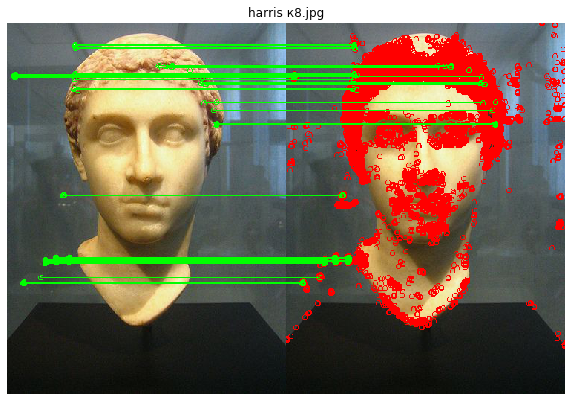

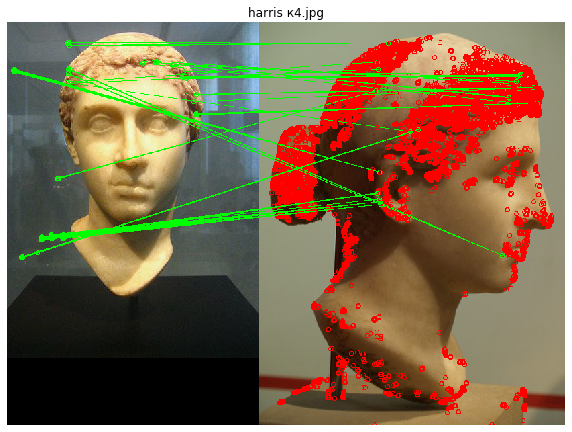

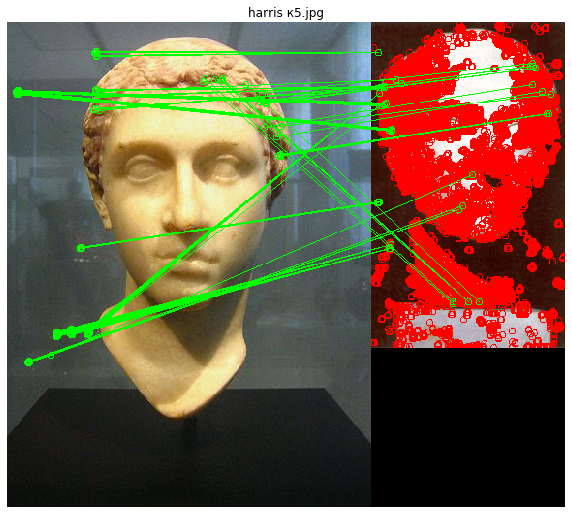

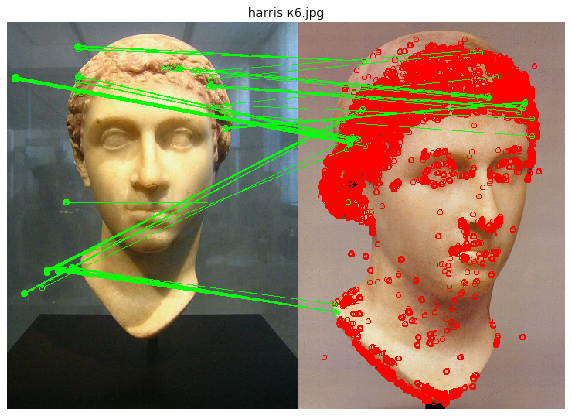

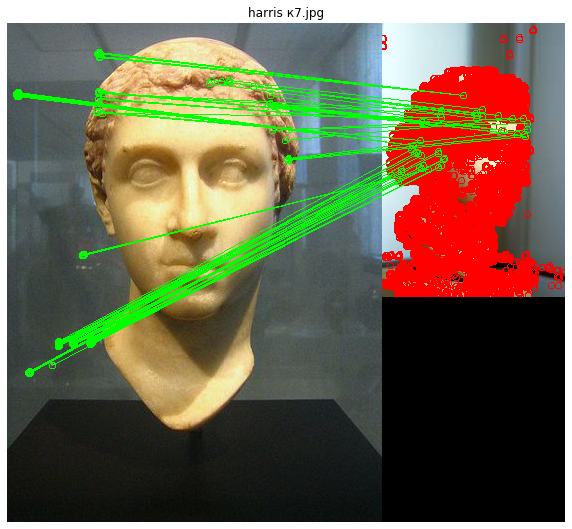

...

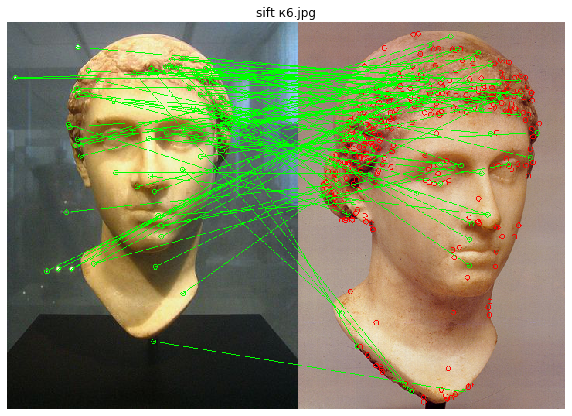

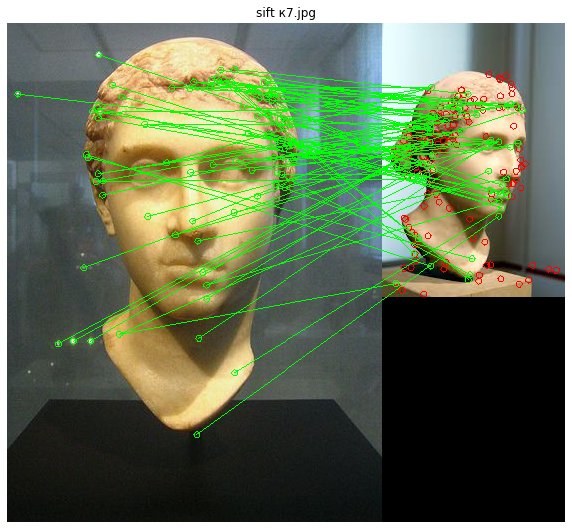

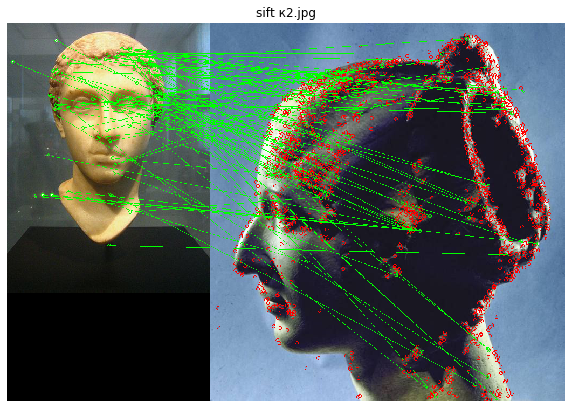

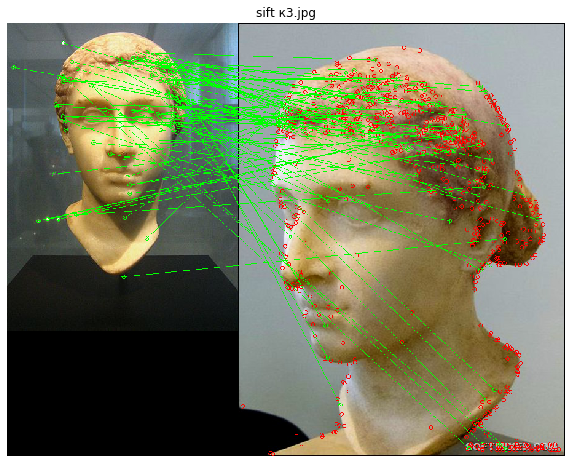

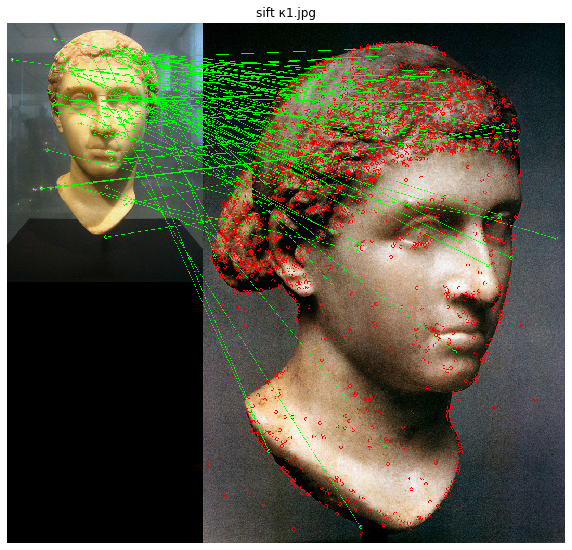

In [6]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 100, 10000), (DETECTOR_METHOD_FAST, 10, 10), (DETECTOR_METHOD_SIFT, 100, 5000)]:
    for img in kleo_img_names:
        pattern, pattern_desc = get_image_description(image.load_img(kleo_images_path + '/' + 
                                                                     kleo_img_names[0]), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(kleo_images_path + '/' + img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True, detector, img)
        plt.show()



```
# This is formatted as code
```

### Bust of Kleopatra

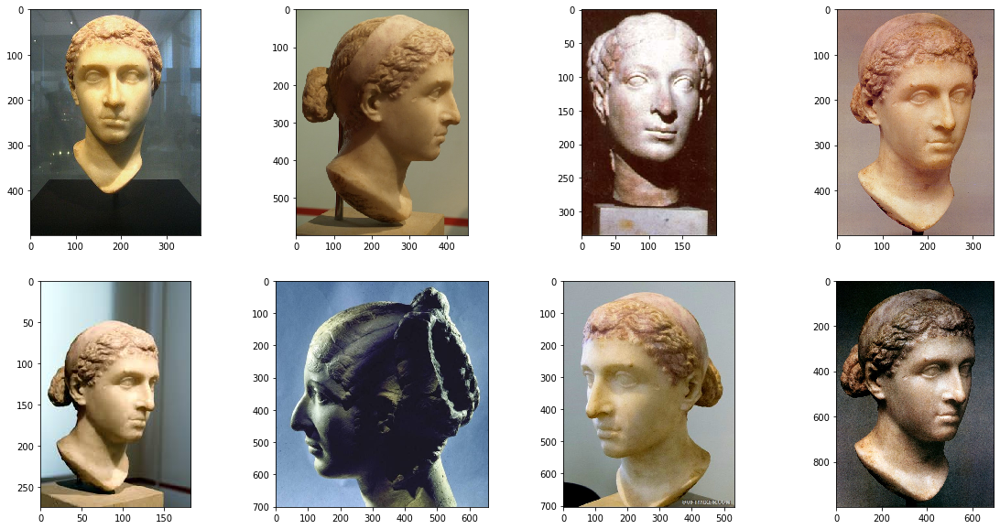

In [7]:
# visualize Kleopatra images
plt.figure(figsize=(20,10))
for i in range(len(kleo_img_names)):
    ax= plt.subplot(2,4 ,i+1)
    img = cv2.imread(kleo_images_path + '/' + kleo_img_names[i])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

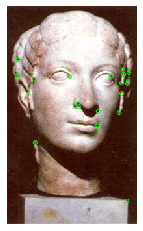

In [16]:
pattern, pattern_desc = get_image_description(image.load_img(kleo_images_path + '/' + 
                                                             kleo_img_names[2]), drawDebug = True)

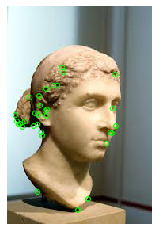

In [10]:
pic, pic_desc = get_image_description(image.load_img(kleo_images_path + '/' + 
                                                             kleo_img_names[4]), drawDebug = True)

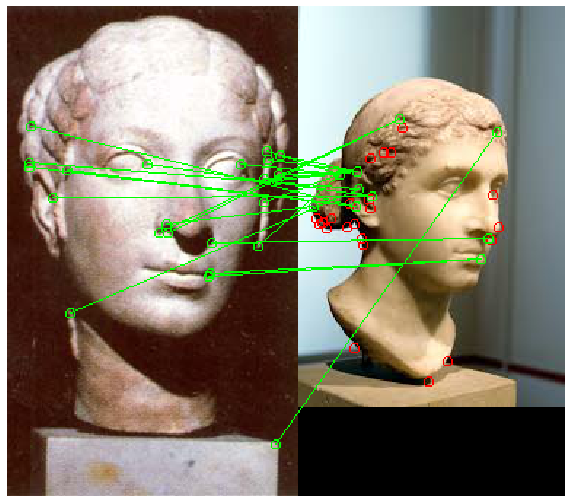

In [17]:
matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)

### Flora

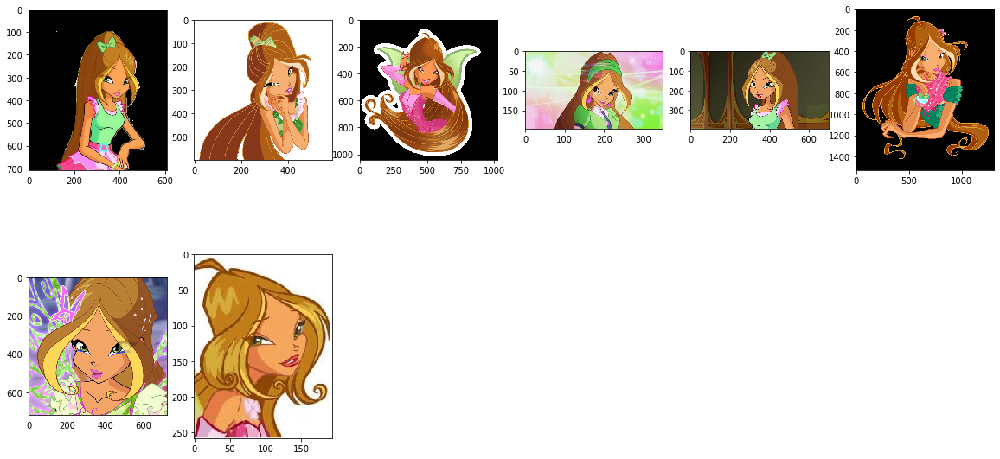

In [18]:
# visualize Flora
plt.figure(figsize=(20,10))
for i in range(len(flora_img_names)):
    ax= plt.subplot(2,6 ,i+1)
    img = cv2.imread(flora_images_path + '/' + flora_img_names[i])
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    ax.imshow(img_rgb)

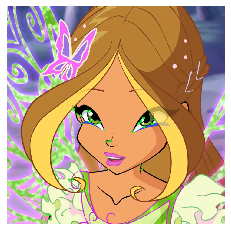

In [20]:
pattern, pattern_desc = get_image_description(image.load_img(flora_images_path + '/' + 
                                                             flora_img_names[6]), detector = 'harris', drawDebug = True)

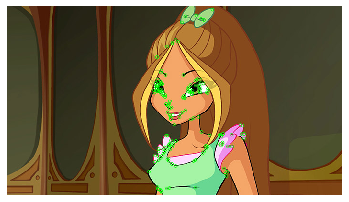

In [21]:
pic, pic_desc = get_image_description(image.load_img(flora_images_path + '/' + 
                                                     flora_img_names[4]), drawDebug = True)

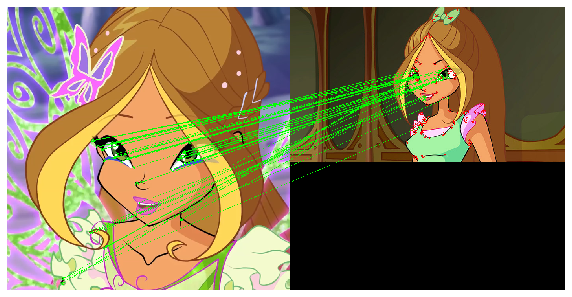

In [22]:
matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True)

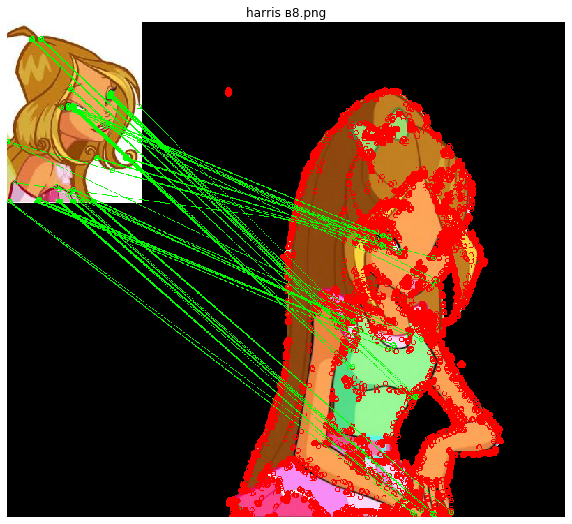

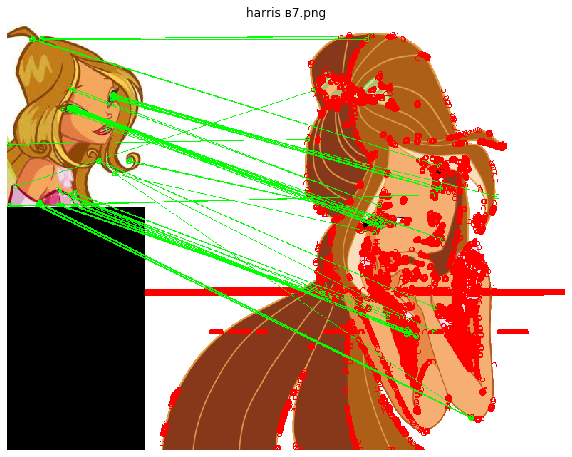

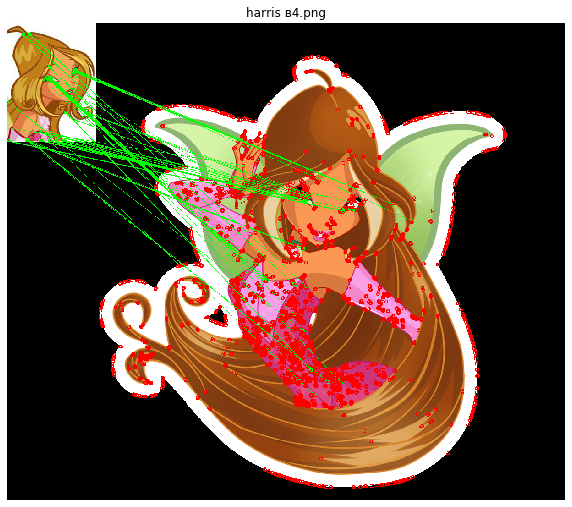

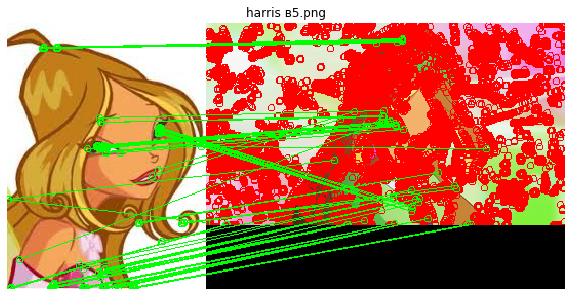

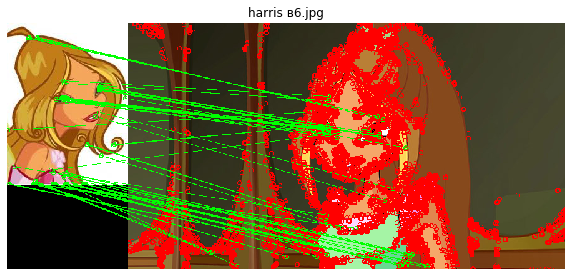

...

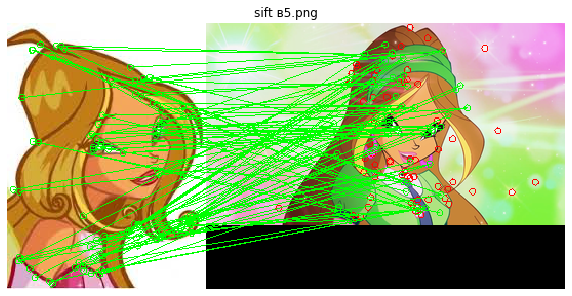

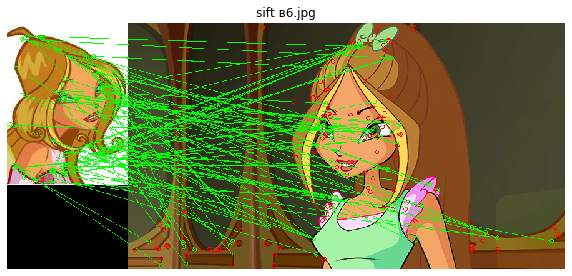

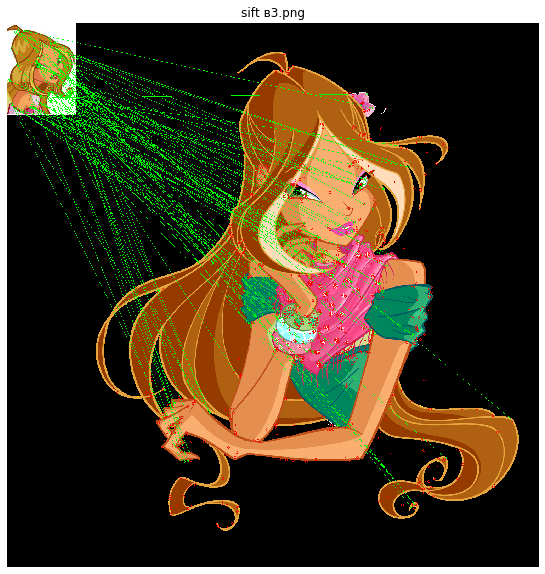

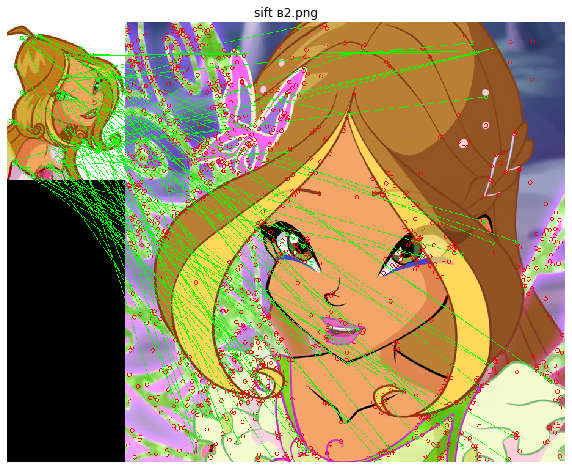

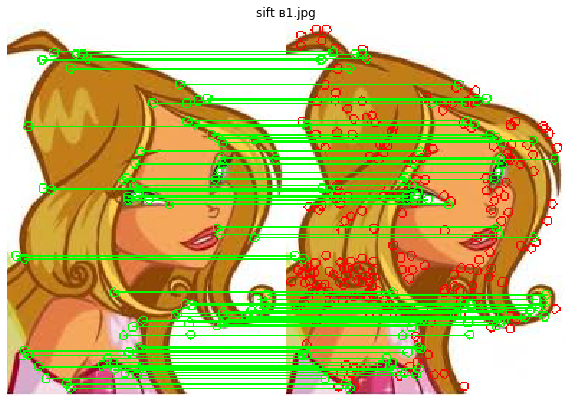

In [25]:
for detector, t_pattern, t_img in [(DETECTOR_METHOD_HARRIS, 100, 10000), (DETECTOR_METHOD_FAST, 10, 10), (DETECTOR_METHOD_SIFT, 100, 5000)]:
    for img in flora_img_names:
        pattern, pattern_desc = get_image_description(image.load_img(flora_images_path + '/' + 
                                                                     flora_img_names[7]), t_pattern, detector=detector, drawDebug=False)
        pic, pic_desc = get_image_description(image.load_img(flora_images_path + '/' + img), t_img, detector=detector)
        matches = keypoint_match(pic, pattern, pic_desc, pattern_desc, True, detector, img)
        plt.show()